<a href="https://colab.research.google.com/github/krishnakanthkona-3110/Interview_Prep/blob/main/Interview_Prep%20/AI_System_Design/AI_System_Design.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Business Problem

This is crucial for a good design

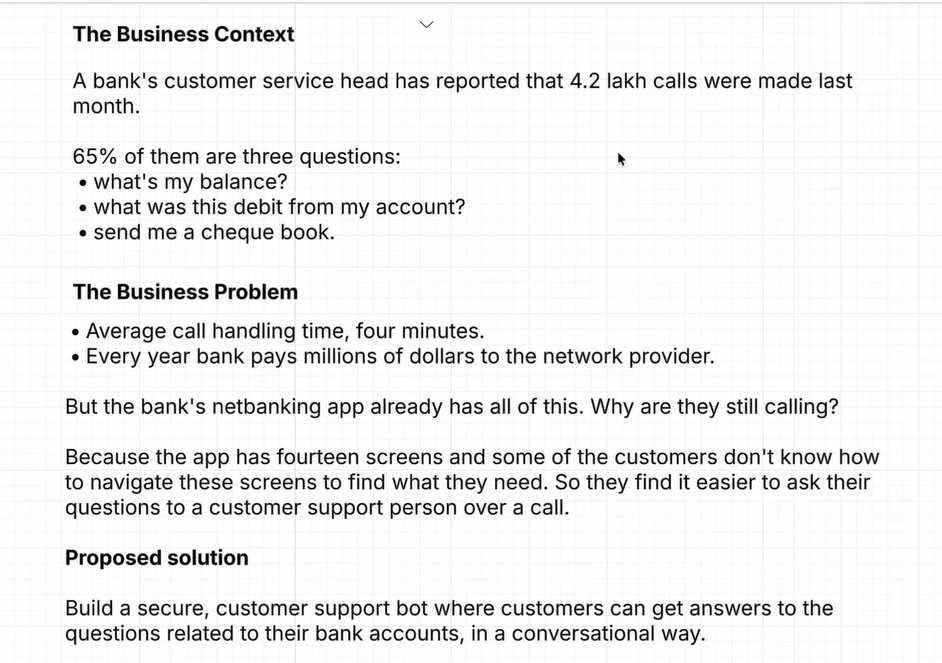

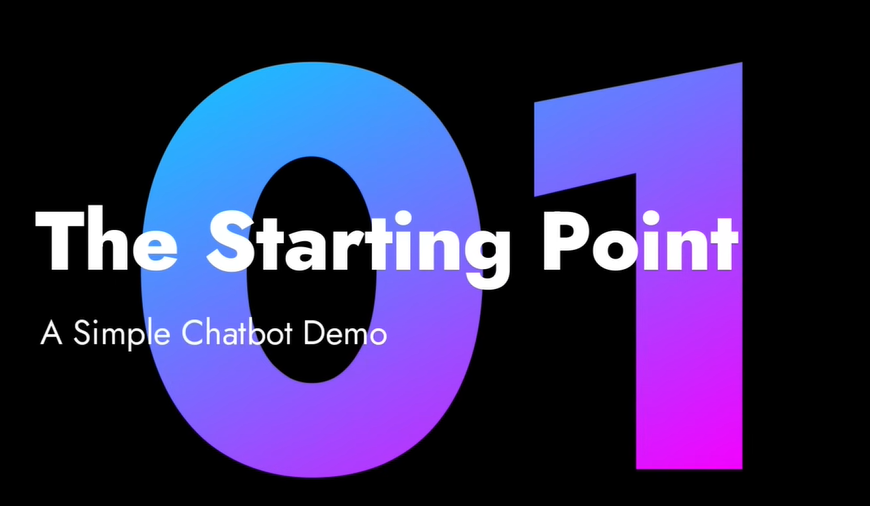

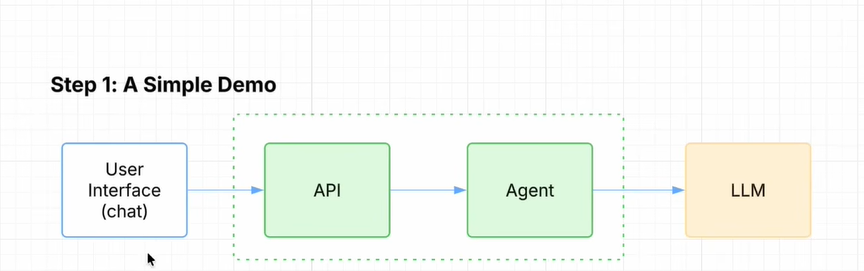

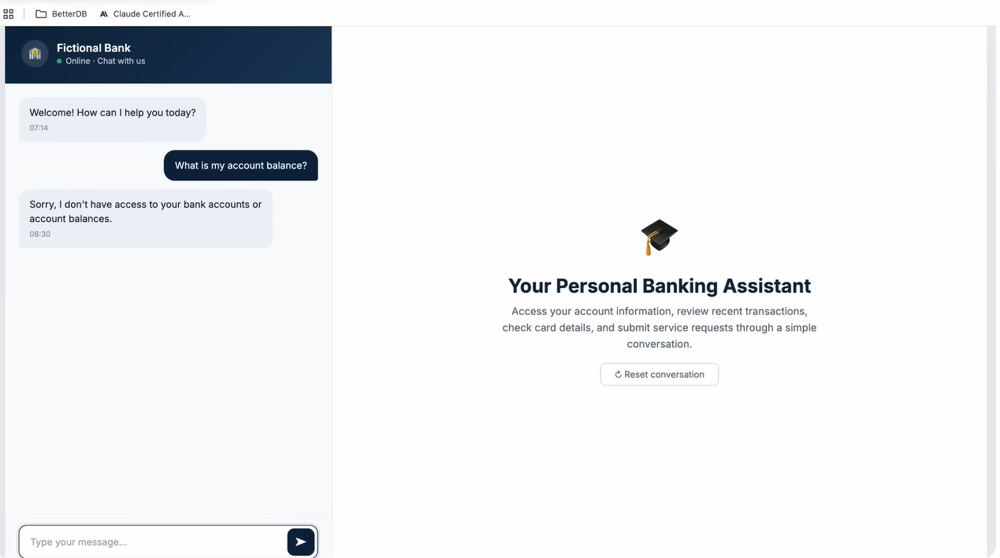

#Created chatbot, but it didn't have bank account access

This is our user interface. I am typing a question here.What is my account balance? The response says, Sorry, I don't have access to your bank accounts or account balances, which is valid because so far we have only created a simple chatbot and have not integrated it with any bank information. So that is our step 2. So the next step is that we are going to give our agent access to the bank's internal tools. In our bank, AP is for balance inquiry, transaction details, statement requests and change of address are already available. That is how net banking works. Everything you see in net banking is an API call and the response from that API is what is shown in our net banking app. So all APIs are already available at the bank.

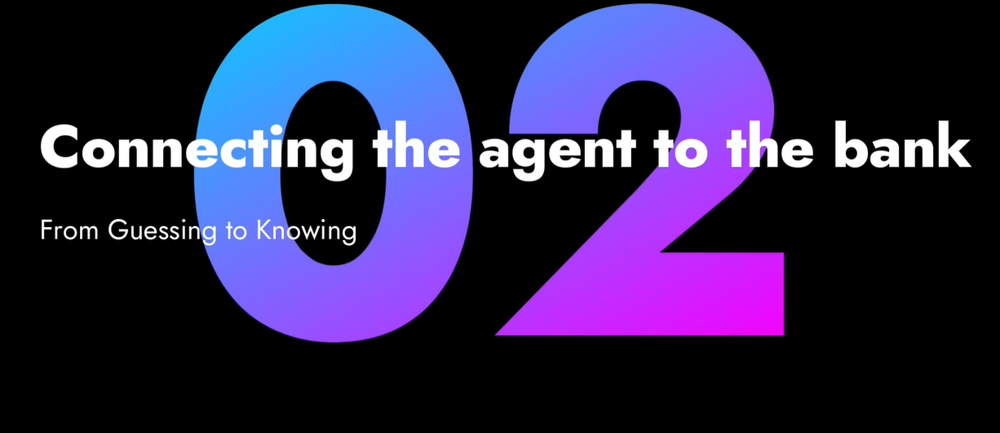

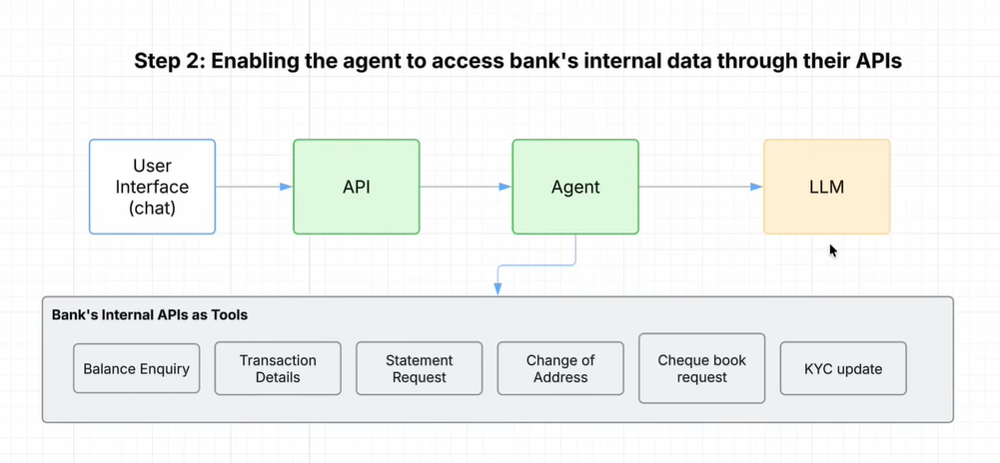

But I have a problem with this design. The problem is that we are attaching many tools to a single agent. Here, I have displayed just six tools. But when you build a real banking application, you will easily end up attaching 30 to 40 tools. So if we attach all the tools to a single agent, problems like tool confusion and tool overload will occur. The large language model might be unable to decide which tool is the correct one to use for the user's question

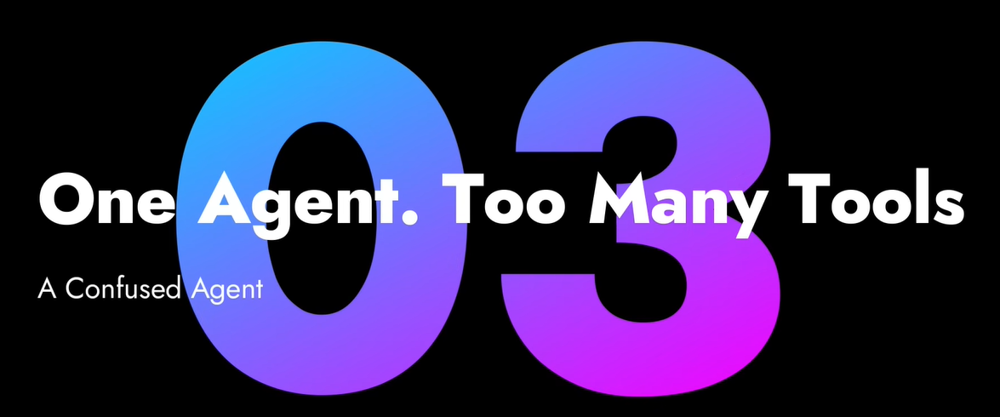

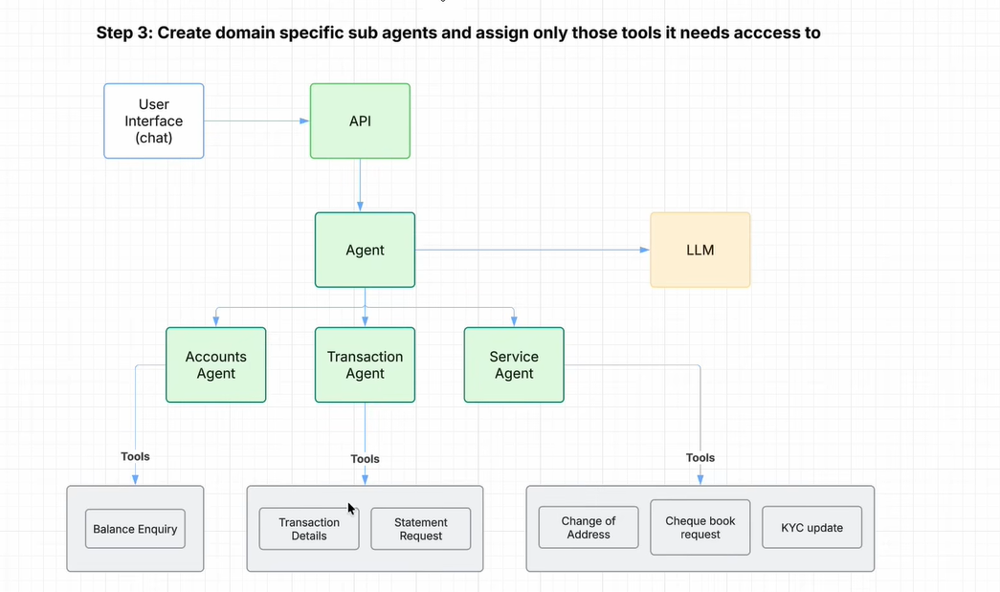

 So, this is our step three: create domain-specific subagents. Instead of assigning all tools to one agent, we have created three separate agents: an accounts agent, a transaction agent, and a service agent. Now, for the transaction agent, we only attach tools related to the customer's transactions. So, this is now a specialized agent. This agent will handle all questions related to customer transactions. This agent will handle all questions related to service requests.That is how we have separated them. So for example, if a user asks what their last five transactions were, the large language model will decide that the transaction agent should handle that question and pass it to our agent. So the transaction agent will use only the correct tools for that and generate the answer to pass to our user.

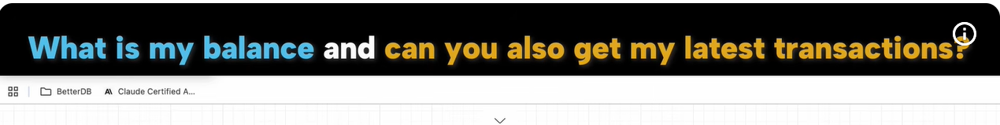

So everything is okay so far. But now I will display a question. Let us first see how to handle this question. So the user's question is, what is my balance and can you also get me my latest transactions? Now a single specific agent cannot answer this question. Right, because we need the balance and the transactions. The accounts agent handles the balance, the transaction agent handles the transactions. So how do we orchestrate this? Because multiple agents are involved in this, right?

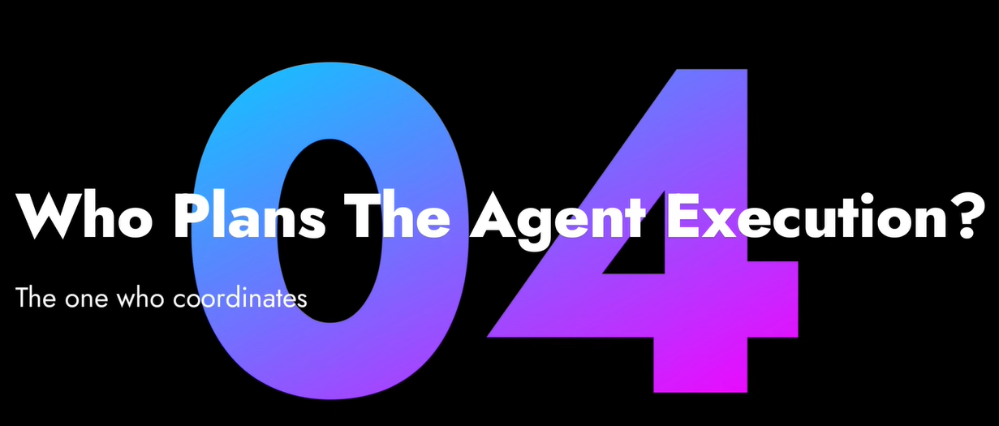

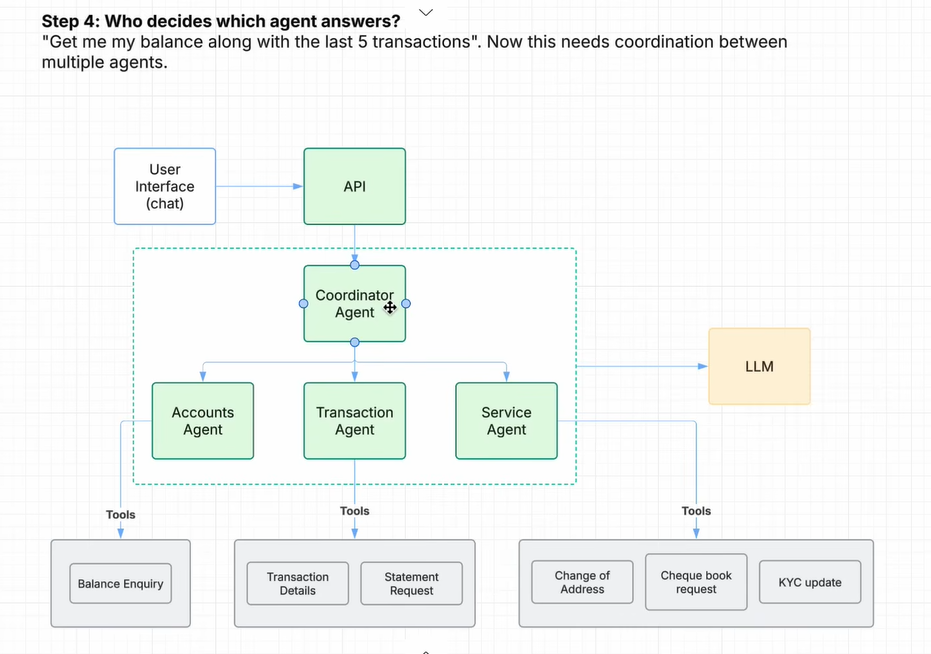

So that is our step 4. It is the same diagram. I have renamed it to coordinator agent, because this coordinator agent is the one that is going to coordinate the complete system of which agents to call and how to generate answers for the questions the user is going to ask.So if the user asks, get me my balance along with the last five transactions, the coordinator agent will use the help of the large language model to create a plan on what steps to follow to answer this question. And first, it will call the accounts agent to inquire about the balance. After that, it will call the transaction agent to fetch the transaction details. And once both answers are received, it will go back to the LLM to generate a final answer for the user. It creates this complete plan and coordinates each of these calls. Right, that is why we call this the coordinator agent. And I have represented all four of our agents in a single box, because every agent will have integration to communicate individually.To bring in a transaction, the transaction agent must go to the large language model and decide which of these two tools to use. Right? So every agent will communicate with the large language model. That's why I put all the agents in one box and attach them to the large language model. So now our Agentic application has taken a bit of shape.

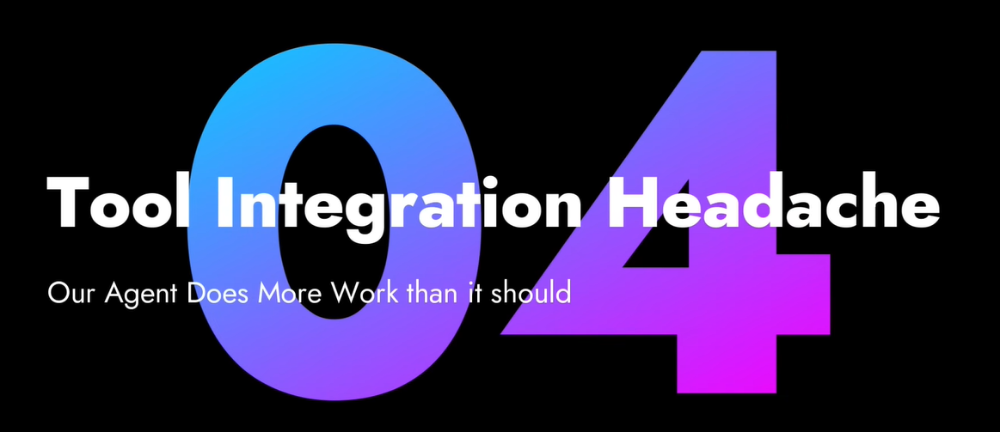

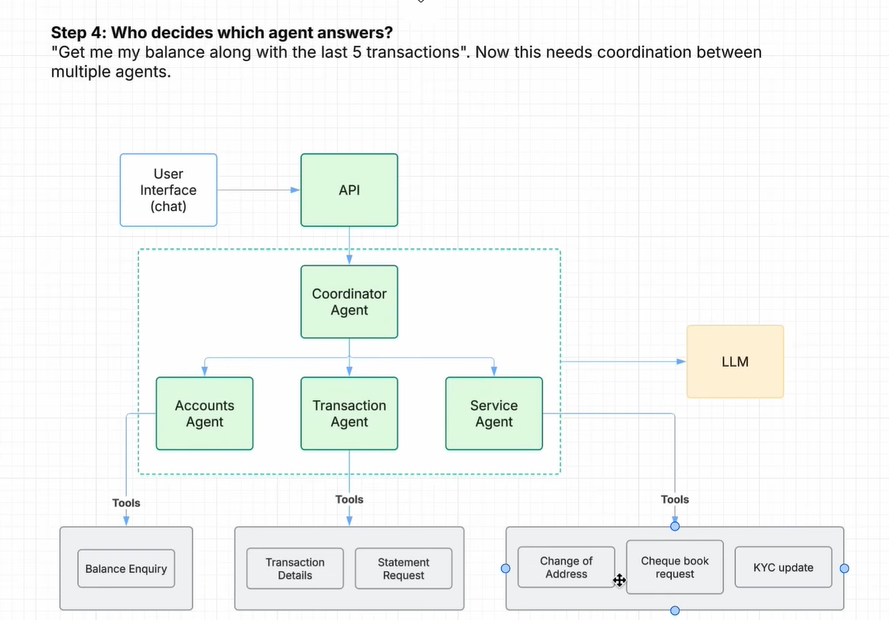

But still, I have a problem with attaching all these tools directly to my agents. For example, we have attached 3 tools to our service agent. So if I have attached 3 API tools to this agent, then how to integrate with those 3 APIs, how to pass the response, and how to handle errors, all these things must be tightly coupled and written programmatically in this agent's code base. But if you look at what a clean design would be, we should only give the agent the proper reasoning work on which tool to use. We shouldn't give the agent all the API engineering work. So I need to separate the work of managing my tools from the agent and keep it loosely coupled.That is why we are going to introduce MCP. So what is our next step?

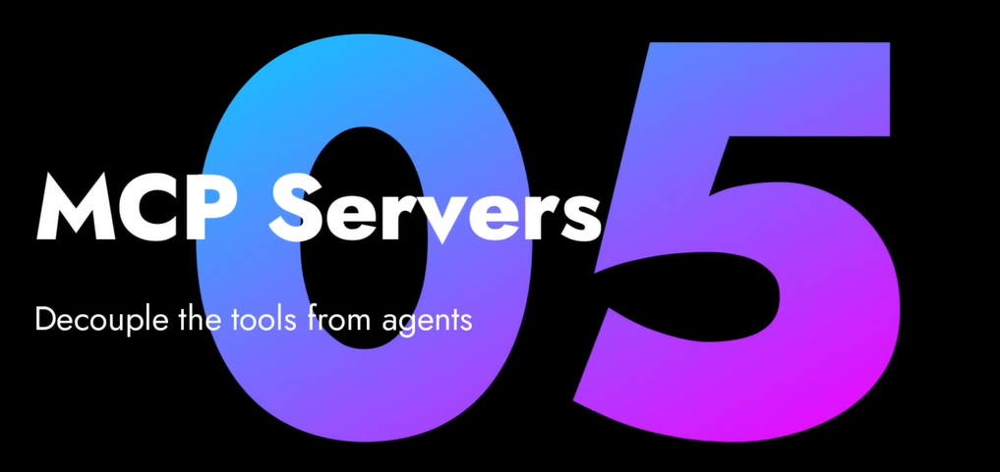

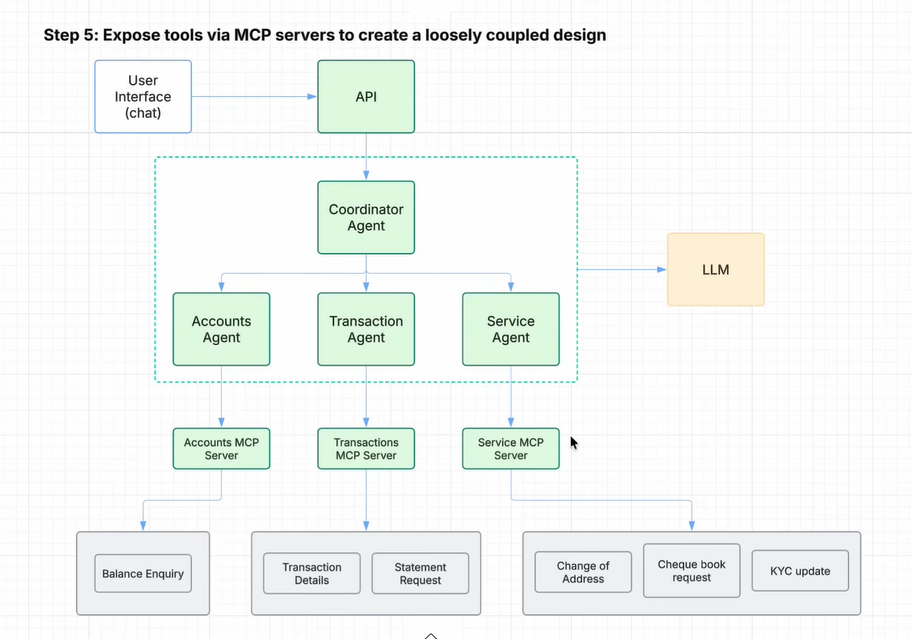

We are creating three different model context protocol servers. An accounts model context protocol server, a transaction model context protocol server and a service model context protocol server. These model context protocol servers will handle all of our tools. So what is this API scheme? How should we call it? And what are the mandatory fields? How to handle errors? All this logic will be taken care of by this MCP server separately. So our agent just needs to communicate with this MCP server.

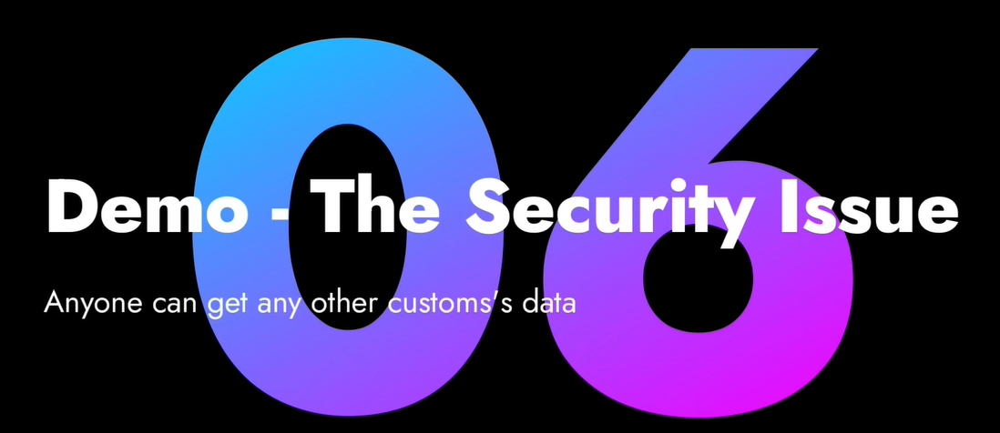

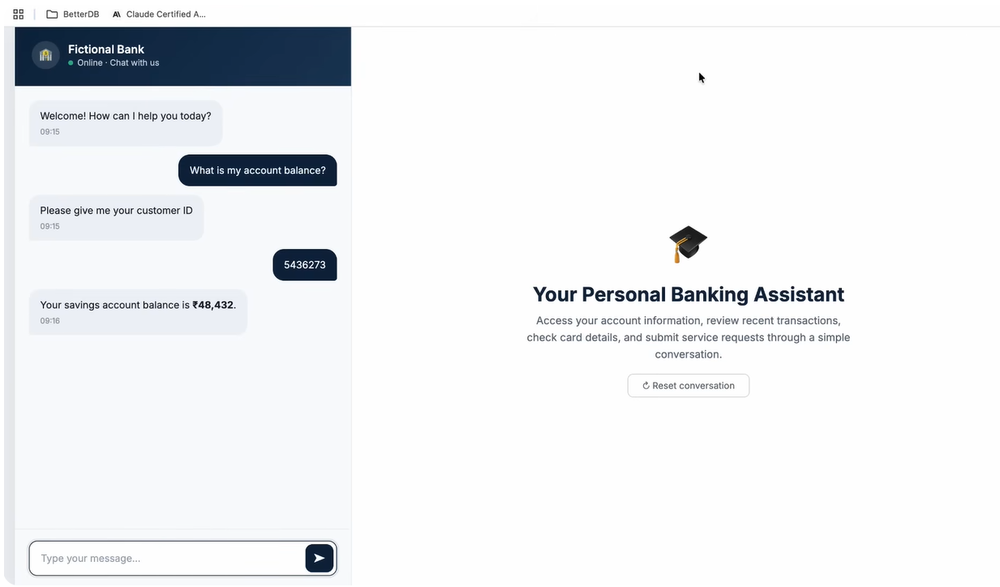

What is my account balance? We have integrated the banking tools now. So we know that the balance enquiry tool must be used. To perform a balance enquiry, we first need the customer ID. We can only retrieve the balance using the customer ID. So it asks, give me your customer ID. I provide my customer ID. The response comes back. Your savings account balance is 24,345 rupees. There is an important problem here. I will explain it with another example. Now I am opening a new conversation and asking, what is my account balance? It asks, please give me your customer ID. Now I know a different customer ID. I provide that ID. It shared the account balance for that ID with me. So if I know any customer ID, I can retrieve their information. Therefore, the agentic application we have built so far is a very insecure application. We have not implemented any kind of security controls. So as a customer, I should only be able to see my own information, another customer's information should not be visible to me. So we need to bring in authentication for that.

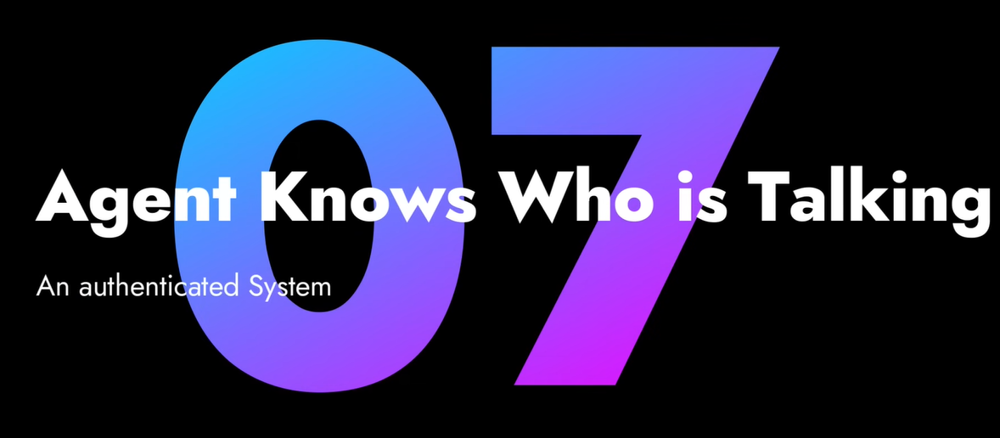

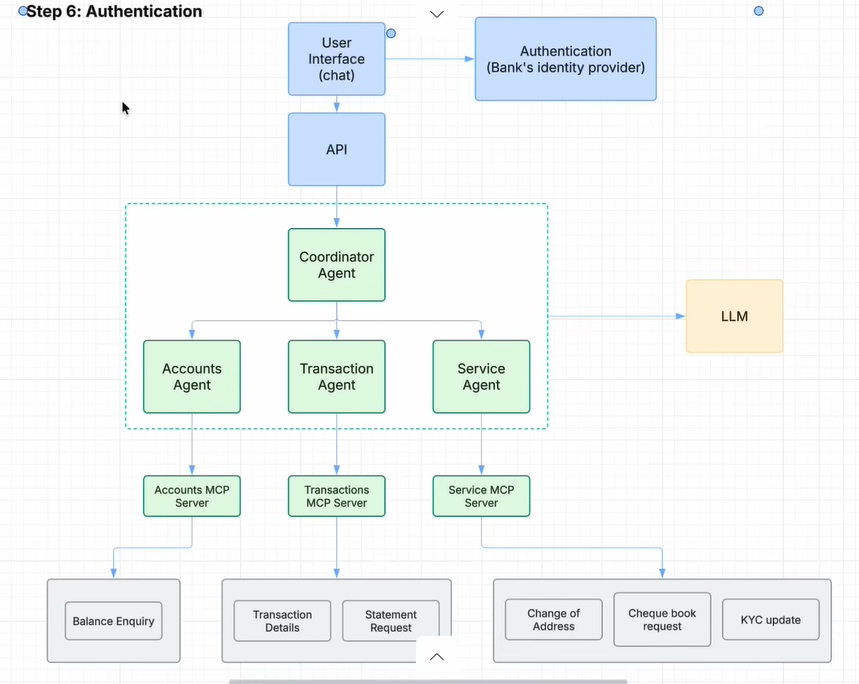

That is our next step.If I ask a question as a customer, the chatbot needs to know that this specific customer is asking, and it should only fetch details for that customer's account. Right? So what are we going to do for that every bank, or rather every major organization will have an internal identity provider of their own. The identity provider will provide all the tools and APs needed for the bank's customers and employees to log in correctly. So we must integrate our agentic application with the bank's existing identity provider. When someone tries to open our chatbot in a browser, the first step will automatically redirect our user interface to that identity provider. There it will ask us to enter a username and password. Once the customer enters their correct ID and password to log in, The identity provider confirms the user is authenticated and redirects them back to our chatbot. Now every question asked in our chatbot will be sent to the API along with the details of the customer who is asking it. So our chatbot will never ask us for a customer ID because automatically the information about which customer asked this question will go internally to our coordinator agent through this API and most probably we will use token based authentication.We do not need to go into the specific details of how this authentication works, because explaining the authentication process would require a separate video. So now we have added the first. Level of security. I will show you an example scenario of how our chatbot works and then explain why we need to add the next level of security. Before moving to the next step, I will show you an example scenario.

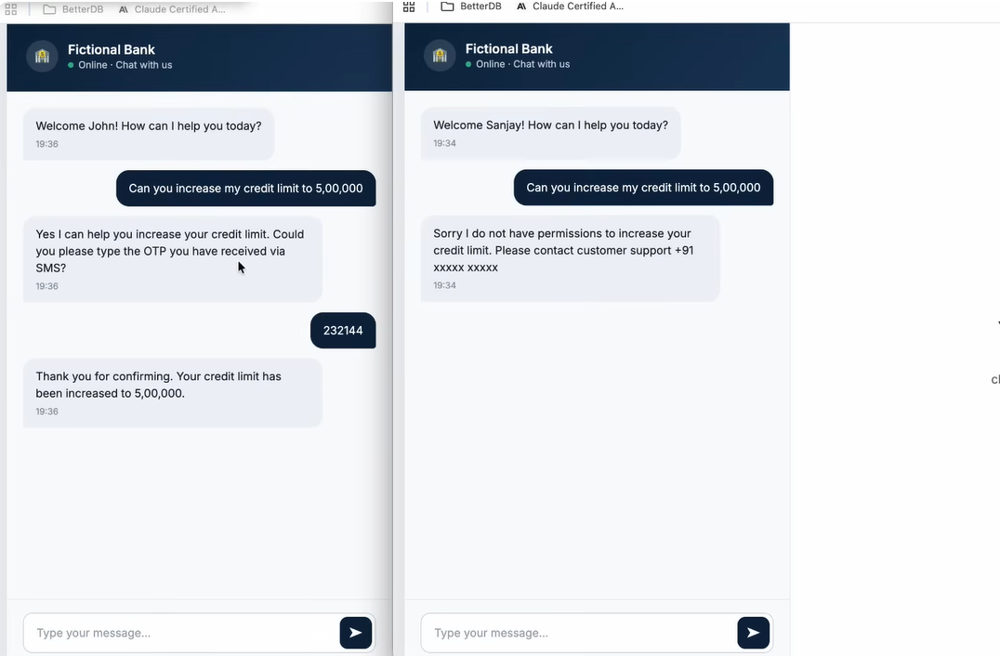

 I have displayed two users chats side by side. Now the users have authenticated. So the chatbot knows who those users are.That is why it has addressed the customers as Welcome John. Welcome Sanjay. So both of them are asking the same question. Can you increase my credit limit to 5 lakhs? For the first customer, it says, yes, I can help you with that and asks for an OTP. Once the OTP is provided, it says, thanks for confirming your credit limit has been increased. For the second customer, it says, sorry, I do not have permissions to increase your credit limit. So how did this functionality happen? Why couldn't the credit limit be increased for the user alone? Because as the next step, we have brought in authorization. Authentication tells us who this customer is by providing that information. Authorization tells us which banking services. A customer has permission to use and which they do not. So we use authorization to check what they are authorized to access.

 Let us assume there are three types of users in this bank: privileged customers, premium customers, and standard customers. If the bank's policy is that only privileged customers can increase their credit card limit, then before the service agent calls the increase credit limit tool, a check will be... The user has access to call this tool or if they are authorized. That is why we also need authorization.


# Authentication tells us who this user is by providing that information.

# Authorization tells us which permissions the user has access and which do not.

Authentication verifies who the user is, while authorization determines what resources or actions that authenticated user is allowed to access.

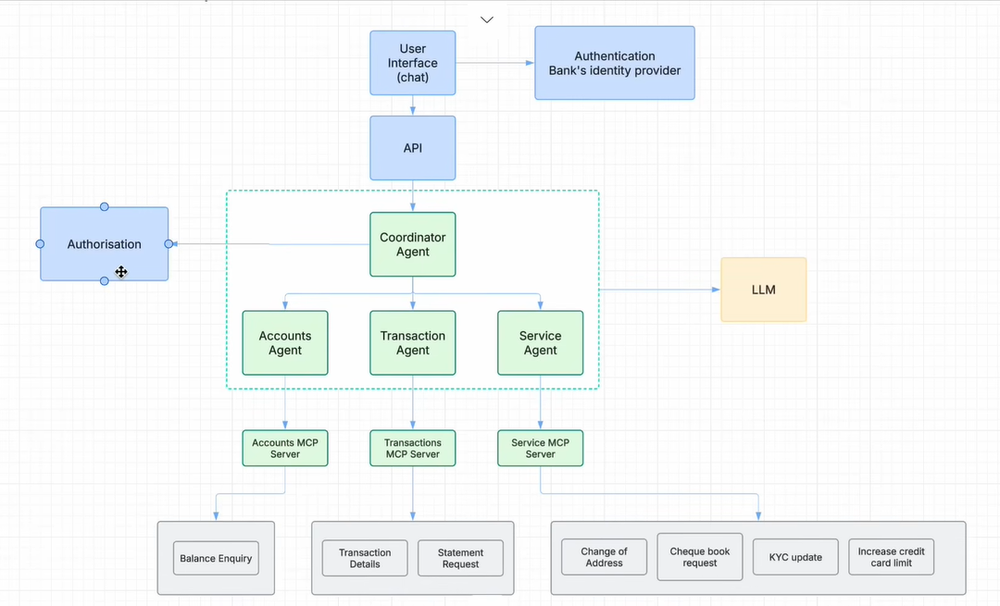

So we need to note an important point here.I have kept some boxes in green and some boxes in blue. All the boxes depicted in green are related to AI. Engineering and everything depicted in blue is related to software engineering, general software engineering. Because even before AI arrived, all the production based software we have developed over these years. Already had components like authentication and authorization. That has nothing to do with AI. So as we add each component, Notice whether it is a blue box or a green box. Wherever a blue box appears, it is all general software engineering. I am showing this difference so that you get clarity on where AI engineering is needed and where it fits into an enterprise level productionized agentic application.

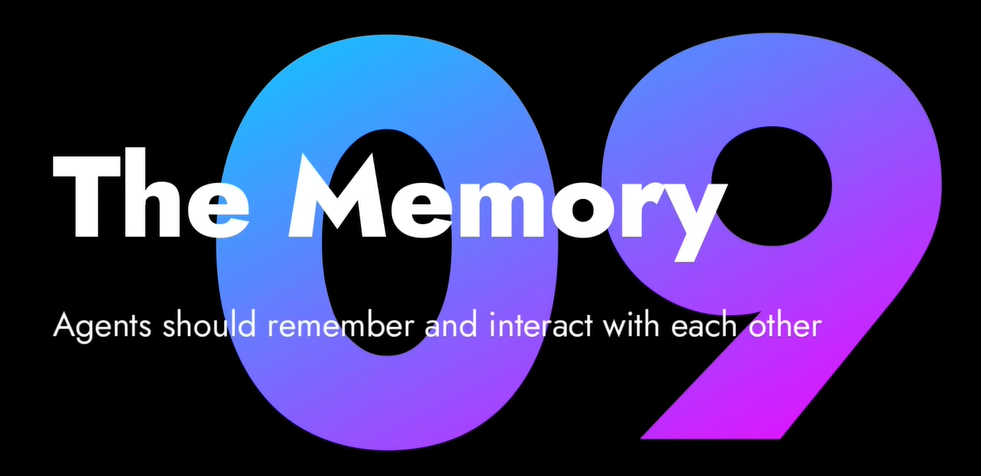

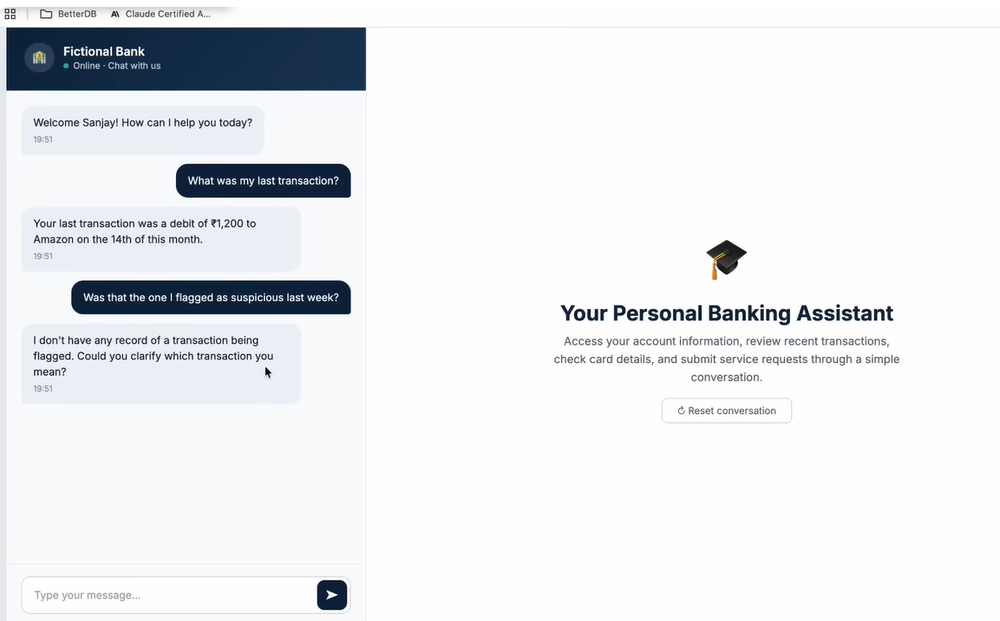

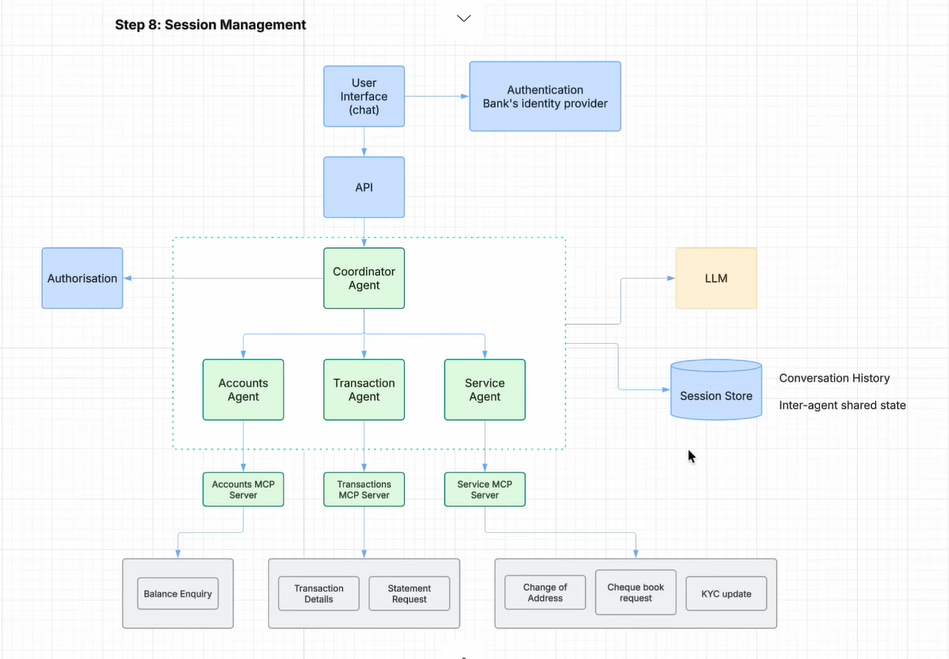

Now let's look at another scenario. I first asked a question, what was my last transaction? Your last transaction was a debit of 1200 to Amazon, it says. So last week I had flagged the same transaction as suspicious. So now what am I asking? Was that the one I flagged as suspicious last week? Now this agent has told us, I don't have any record of a transaction being flagged. Could you clarify which transaction you mean? So there are two problems with this response. The first statement says that we flagged A transaction as suspicious through the same chatbot last week, but this agent doesn't have that information. And the second statement is even worse.It asks, Could you clarify which transaction, but the details of which transaction are in the previous message? Which means when we send it to the LLM, we can include the complete conversation history, because LLMs are stateless. They process every question we ask individually. The LLM does not know what we asked before, because the LLM has no memory. So we need to include the user's previous messages along with the final question from our application. Only then will the LLM understand the context and respond to us. Okay? So to save this past conversation history, we need storage. For that, we are introducing a data layer called session store. In this session store, we will store things like the customer's conversation history, the complete conversation history of what each customer has discussed previously. And another important thing is the inter-agent shared state. For example, in the user flow, the transaction agent is called, performs some reasoning and provides a response to the user. If it wants to share some outcomes based on that reasoning with other agents, it must store that data in a shared state. So that all agents can access it. And again, this is a software engineering aspect, not something you can call AI engineering.

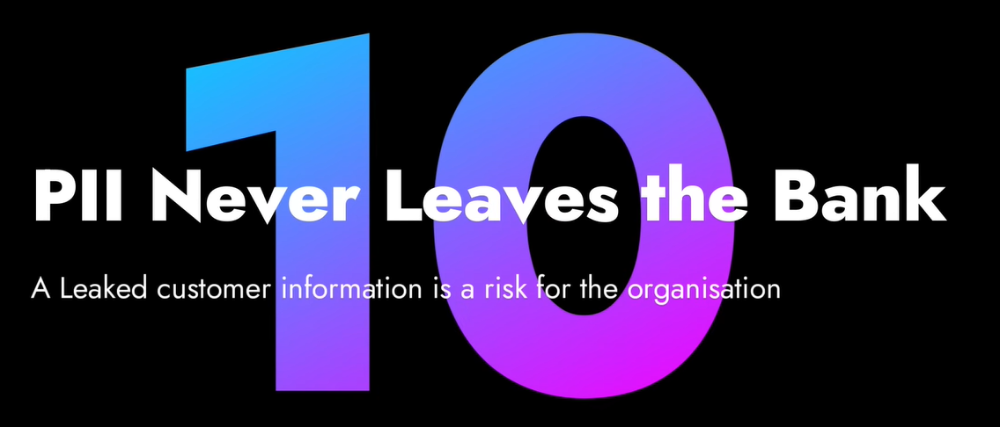

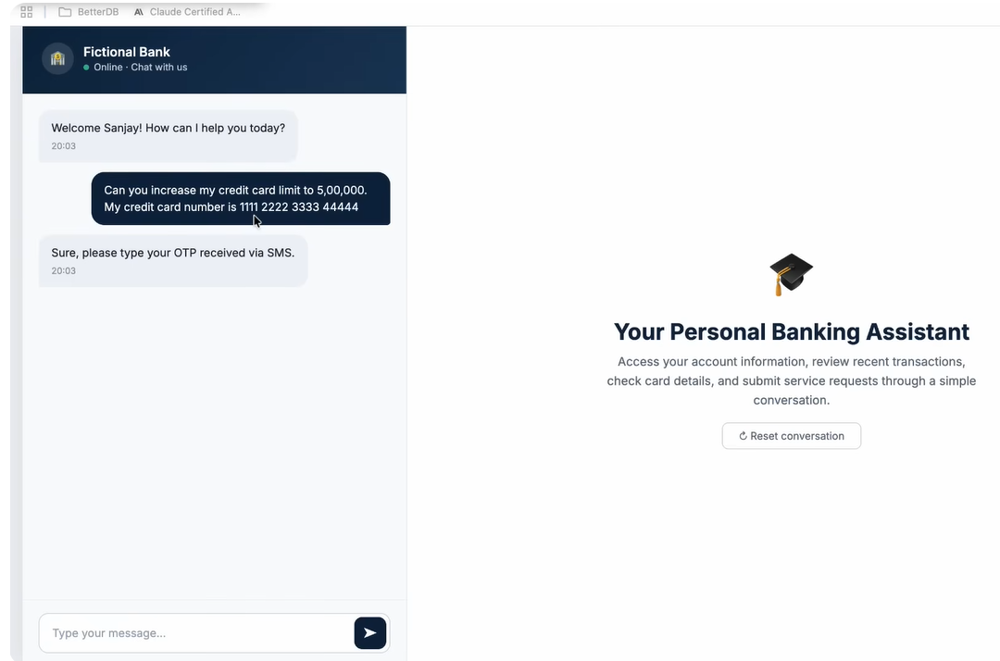

Now the customer has asked another question.Can you increase my credit card limit to 5 lakhs? My credit card number is, and they have provided their credit card number details. So now the customer's credit card number is personally identifiable information. We call it PII. It is something that must be kept very secure. We should never share it with any third party. So now, as soon as this user's prompt hits our system, what do we do? First, we send this message to the LLM through our agent. We ask it which tool I should call. So we have given the customer's complete credit card number to the LLM. This LLM is a third party service, right?Let's assume we are using models from companies like Cloud, Gemini or OpenAI through an API. So it would be like we ourselves leaked our customer's credit card information to that third party large language model. That is a huge risk for the bank.

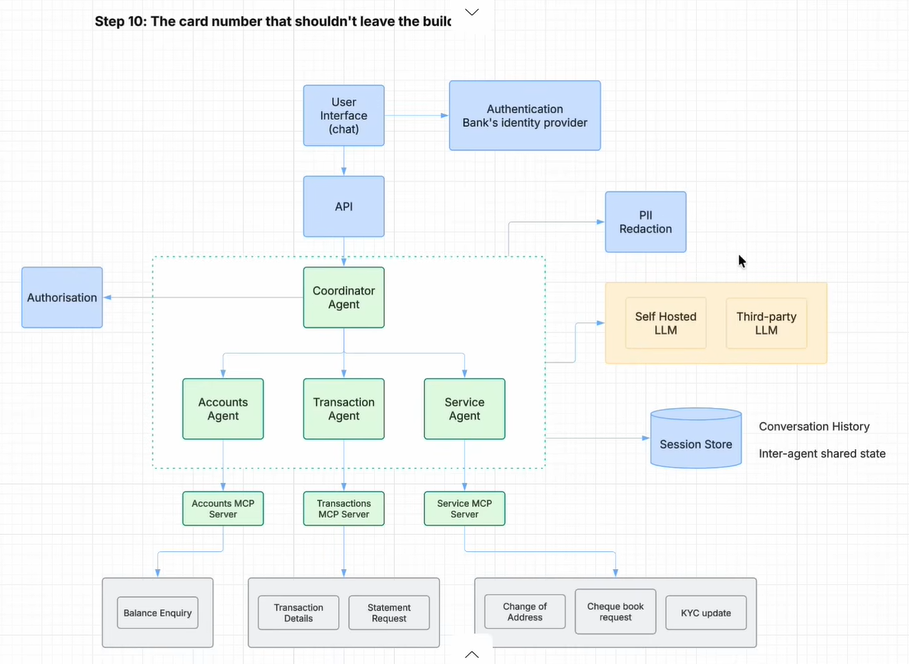

To handle this, We are going to add two different components to our design. The first one is personally identifiable information reduction. So for any input message from the user, we use a service called personally identifiable information reduction service to check if there is any personally identifiable information in the user's message. And if it exists, we will mask that data before we send it to the next step.
# PII

That is PII redaction. Again, this is also software engineering work. Additionally, we are making another decision. Instead of sending every prompt the user gives to a third party large language model, we will deploy an open weighted large language model. In our own environment, let's say our cloud environment, and use a self-hosted large language model so that our large language model stays within our environment boundary. It stays within our secure boundary. Our data or bank's data does not leak anywhere outside, but we have also integrated a third party large language model only for complex reasoning. We use a third party large language model only if our system requires complex reasoning. For all general reasoning, we are going to use a self-hosted large language model. And even with the self-hosted large language model, we will definitely perform personally identifiable information detection before sending any data to the model so that none of that secure information leaks. Now we have an agentic solution that is fully functional. So what does a developer do now?

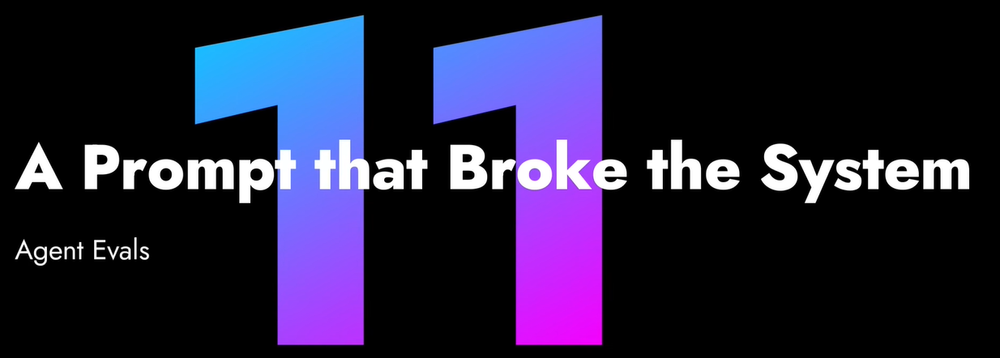

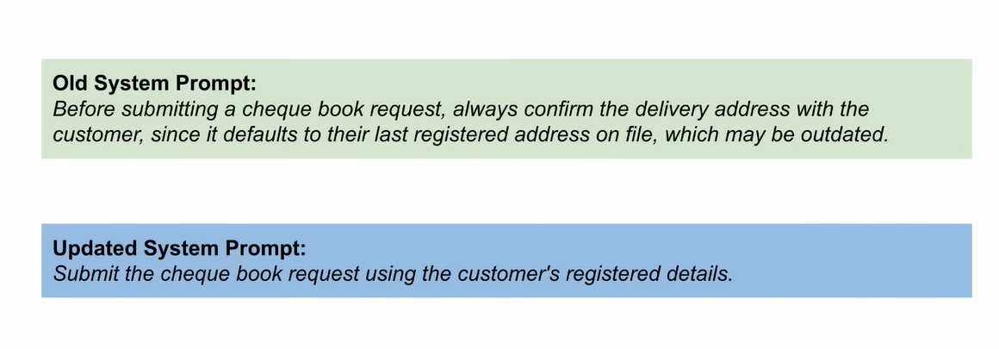

They update the system prompt. The old system prompt was before submitting a checkbook request, always confirm the delivery address with the customer. So in the updated prompt, they changed it to submit the checkbook request using the customer's registered details. So it won't get confirmation from the customer. Suppose the customer hasn't updated their address in the bank. Yet, the checkbook will be delivered to the wrong address.So how can we find out that some features in a system that was already working correctly are not working now? That is why we are introducing an agent evaluation suite.

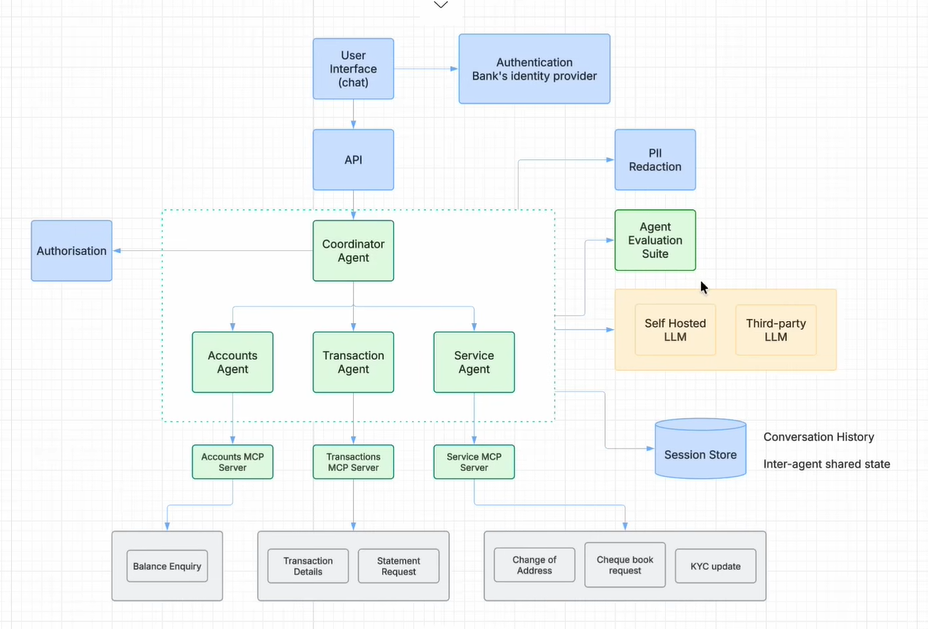

So for this evaluation suite, we would have thought of various edge cases regarding the prompts a user might give and created a golden data set. We would have tested if our system works correctly in all scenarios using test cases. I have put this in a green box because these are not like the test cases we write for regular software. They are not unit test cases because for AI applications, what we are testing is a non-deterministic flow. The LLM is not going to give the same answer every time to the user's question, right? Everything is going to be descriptive in natural language. So this is a non-deterministic flow. For that, we need to write our test suite using different mechanisms. So that also comes into AI engineering.

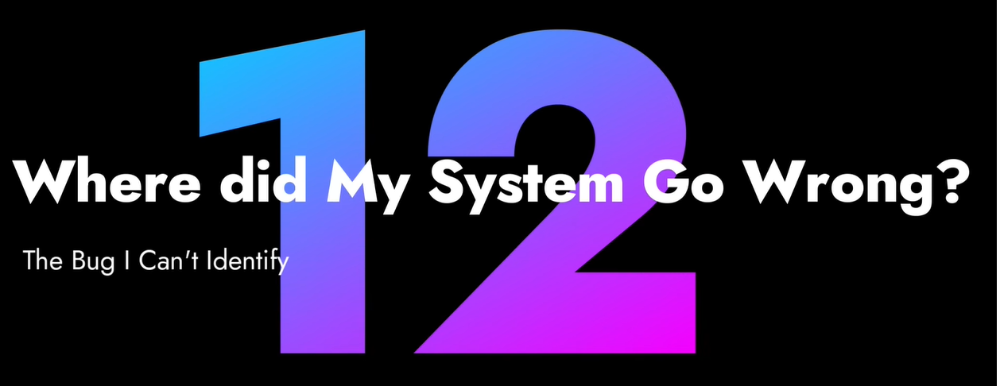

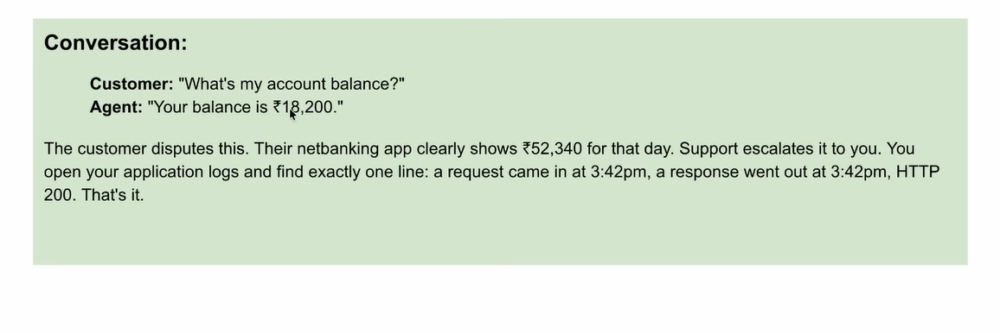

Now a customer has asked a question on our chatbot. What's my account balance? The agent confidently responded. Your account balance is 18,200. So the customer is now disputing it. Their net banking clearly shows 52,340 rupees. But the agent says it is only 18,200. So the customer raises an issue and it comes to our support team. Now we need to find out where our agentic system went wrong. So we open our application logs. We only have one piece of information. At 342, a request came from that customer. At 342, the response to the customer's question was also sent from our system. There is no other information. What prompt came from the user? Which agent called? Which tool did that agent call? What inputs were passed to that tool? There is no information like this at all. Then we won't be able to find out where our system went wrong. So we should never productionize a system like this. That is why we are introducing a layer called observability. This is very, very important. The reason I have depicted both the green box and the blue box is that for all general software systems, we definitely include observability in that we keep monitoring all aspects like CPU, memory, and disk utilization, and we also include proper logging in our application. But for AI systems, we need to monitor a few extra things. What prompts came in for a particular user interaction? Which agent was called? Which sub-agent was called? Which tool did that agent call? What information was passed when an agent communicated with the large language model? What parameters were given as input when a tool was called?

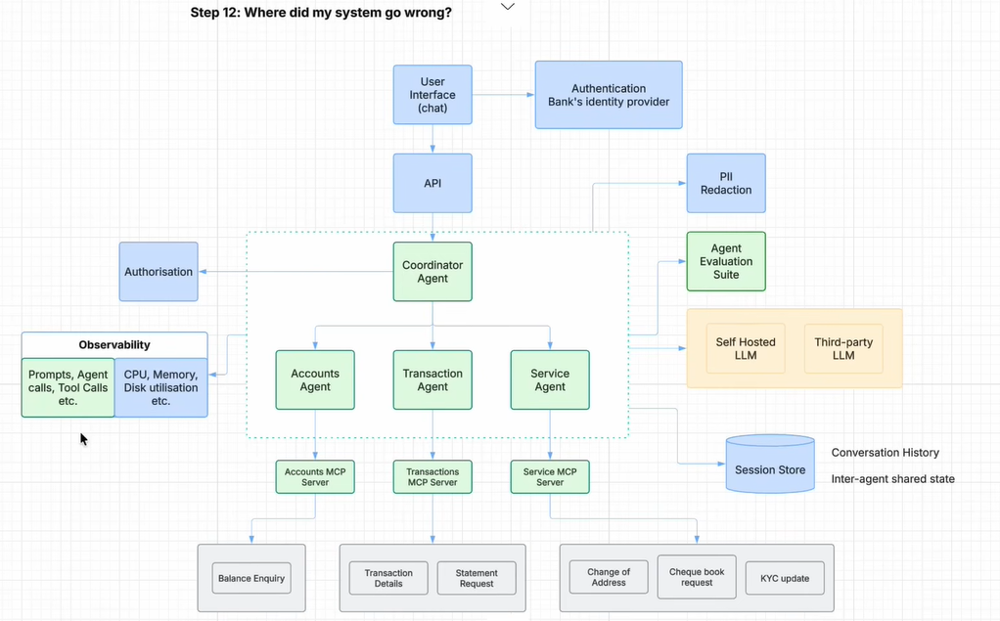

Only by tracking all these things can we find out why a system failed and fix it. So before putting an application into production, we must include all aspects for tracking, monitoring, and troubleshooting it. Because there is no history of any software we develop working 100% perfectly, issues will definitely arise. Some scenario we haven't thought of will definitely occur in production. Our system will fail in that scenario. We can find out why it failed and fix it. That is software maintenance.

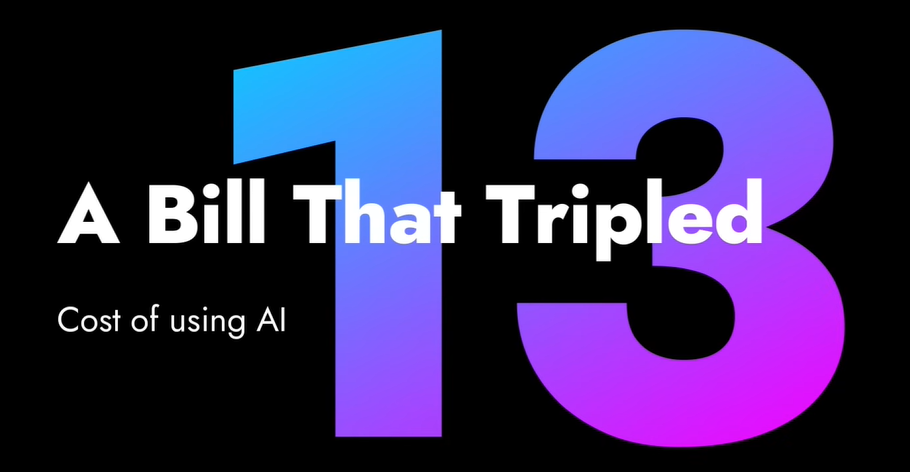

since this is an AI application, we are interacting with a large language model at every layer. And whenever we interact with a third party large language model, we are definitely going to incur costs, right? And this cost is not a deterministic cost. We cannot decide upfront exactly how much it will cost. Because this cost is going to change based on how much the user consumes our application. So especially for AI applications, we must definitely track the cost.

When the cost goes out of hand, we need to know where our application is spending so much. So to decide what kind of cost controls we need to bring into our application, we must track the costs.

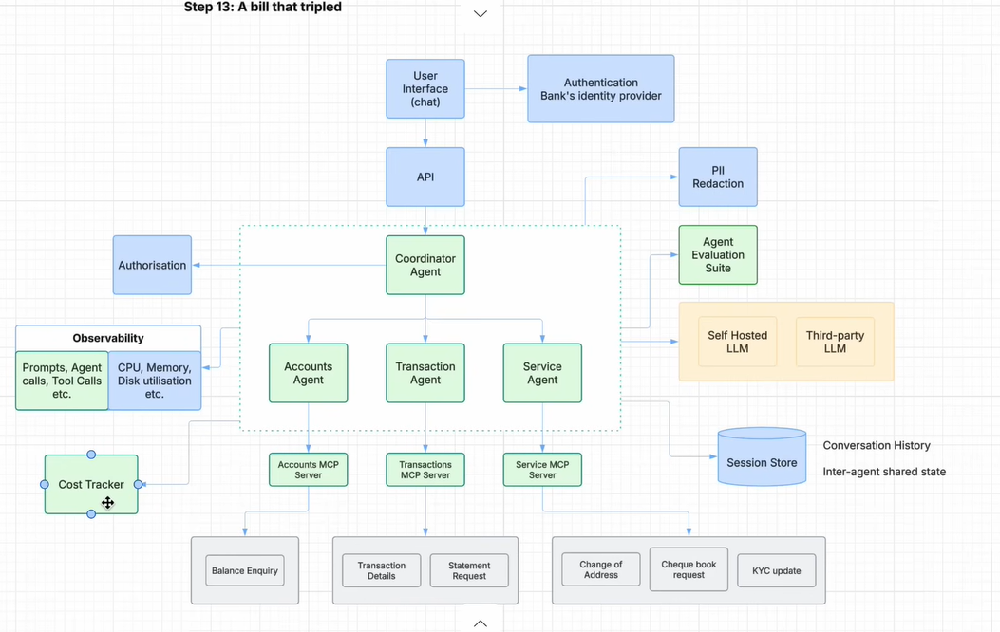

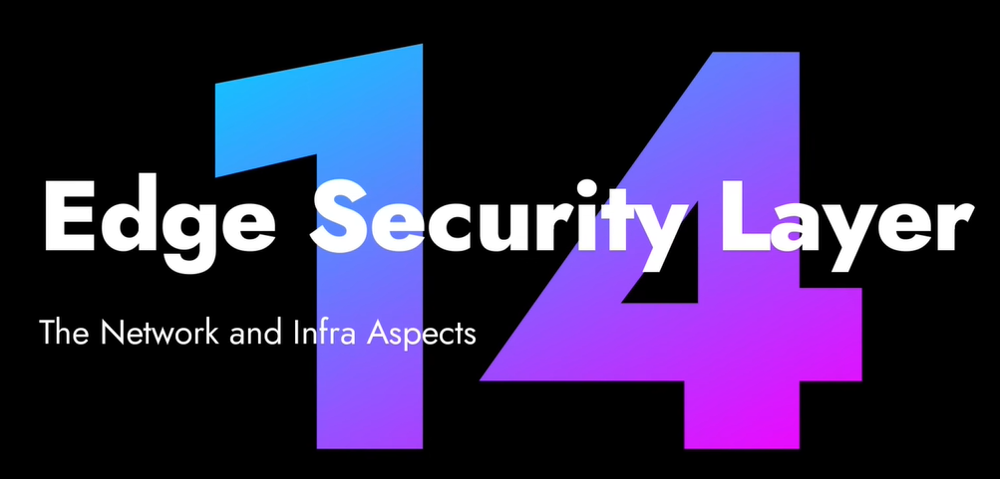

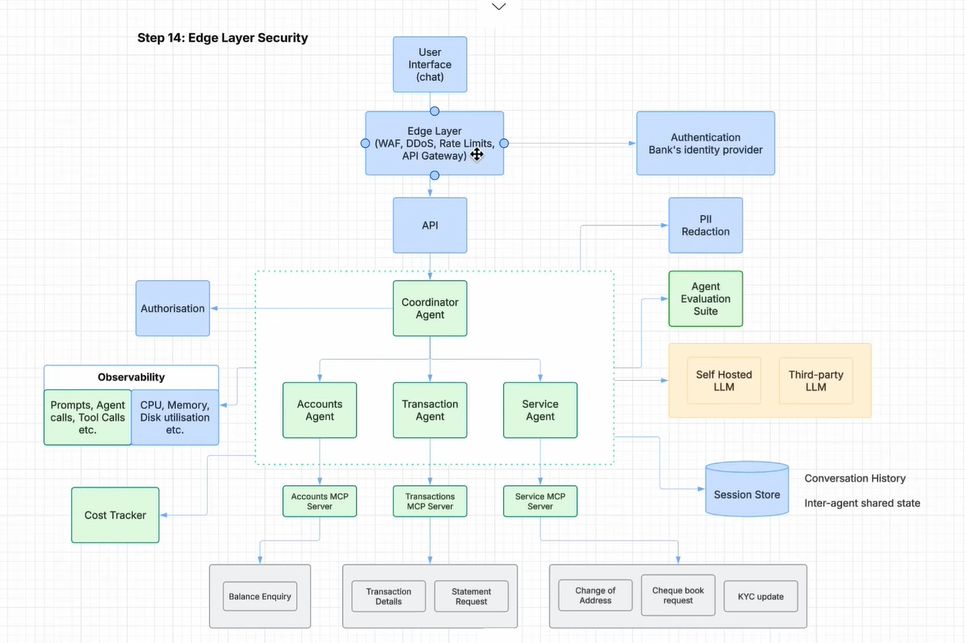[link text](https://)

So now we have a complete structure for our agentic application. This application is ready to be productionized. So when we are about to productionize it, we will encounter some networking aspects. So everything we have done so far is the internal design of the application. We have done everything needed to make this application work correctly. If we are going to deploy this application to a server, we will have to deal with infrastructure and networking aspects. I will show just one example of that and then we will finalize this design.So beyond this user interface, all the requests coming in will pass through an edge layer before entering our infrastructure, our secured banking infrastructure. In this layer, many security controls will be implemented.

Web application firewall policies to prevent denial of service attacks and rate limits.

Rate limits mean information like a single user can only send four requests per second because attackers will try to bring a system down by sending 1000 requests in one second. So that is why we have rate limits.

API Gateway. Before hitting our API, it passes through that API Gateway layer where we have written many security policies. We have included the necessary authentication requirements. Through the API gateway, we can directly integrate our bank authentication provider. So, only after passing through these controls does the request reach our backend server. Therefore, edge layer security is very, very important. Beyond this, there are some networking and infrastructure aspects, but let us not cover everything in one video. So this architecture is already a completed production ready architecture.